In [ ]:
# import required packages
# for data manipulation
import pandas as pd
import numpy as np
from scipy import stats
import geopandas as gpd

# add basemap
!pip install contextily
import contextily as ctx

# packages for visulising data
import seaborn as sns
import matplotlib.pyplot as plt
!pip install geoplot
import geoplot as gplt
import geoplot.crs as gcrs
# Toolkit for map projection and conversion using the PROJ.4 library
import pyproj
# Generate hierarchical statistical maps
!pip install mapclassify

# import the required machine learning packages
from sklearn import cluster
from sklearn.preprocessing import scale

# set seaborn plotting theme to white
sns.set_theme(style="white")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.5/21.5 MB 51.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 32.0 MB/s eta 0:00:00


# 1. Data Preparation
Data including Access to Health, Assets and Hazards data (AHAH), estate_price.csv and population density have all LSOAs' data, so data of Bradford needs to be extracted according to LSOA code.

# 1.1 Data Extraction


In [ ]:
# read required data,
AHAH = pd.read_csv('AHAH.csv')
crime_rating = pd.read_csv('crime_rating.csv')
estate_price = pd.read_csv('estate_price.csv')
population_density = pd.read_csv('population_density.csv')

In [ ]:
#merge all data to one dataframe

# join the AHAH data to the crime_rating using a lefthand join, on the common ID 'LSOA21CD'/'lsoa21cd'
merged_df = crime_rating.merge(AHAH, how='left',left_on='LSOA code',right_on='lsoa11')

# join the estate price data to the merged_df using a lefthand join, on the common ID 'LSOA21CD'/'lsoacode'
merged_df = merged_df.merge(estate_price, how='left',left_on='LSOA code',right_on='lsoacode')

# join the population density data to the merged_df using a lefthand join, on the common ID 'LSOA21CD'/'geography code'
merged_df = merged_df.merge(population_density, how='left',left_on='LSOA code',right_on='geography code')

In [ ]:
merged_df

,LSOA code,number of crimes,crime_rate(%),lsoa11,ah3h,ah3g,ah3e,ah3r,ah3ahah,lsoacode,hpmd202003,hpmd202103,date,geography,geography code,Population Density: Persons per square kilometre; measures: Value
0,E01010568,113,0.137870,E01010568,0.295392,-0.563307,0.211520,0.257373,17.586385,E01010568,197997.0,224611.0,2021.0,Bradford 016A,E01010568,2819.4
1,E01010569,396,0.483157,E01010569,0.274848,-0.790819,-0.006895,-0.015293,14.043912,E01010569,161674.0,168978.0,2021.0,Bradford 016B,E01010569,2744.2
2,E01010570,79,0.096387,E01010570,0.746836,0.191931,-0.195301,-0.576744,19.339961,E01010570,419947.0,422778.0,2021.0,Bradford 018A,E01010570,1814.4
3,E01010571,256,0.312344,E01010571,0.018888,-0.894241,0.209017,0.421387,16.063457,E01010571,144686.0,143759.0,2021.0,Bradford 016C,E01010571,3662.9
4,E01010572,56,0.068325,E01010572,-0.032904,0.070606,0.184652,0.193203,17.806164,E01010572,183674.0,195984.0,2021.0,Bradford 016D,E01010572,5602.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
306,E01033694,123,0.150071,E01033694,-1.613182,-0.279867,0.001111,1.816255,25.702532,E01033694,151681.0,162061.0,2021.0,Bradford 020F,E01033694,4383.8
307,E01033695,151,0.184234,E01033695,-0.326804,-0.303123,-0.034668,0.205109,13.140797,E01033695,150158.0,152382.0,2021.0,Bradford 049H,E01033695,4983.9
308,E01033696,158,0.192775,E01033696,-0.052161,0.022886,0.012078,-0.126506,14.628886,E01033696,154193.0,140319.0,2021.0,Bradford 049I,E01033696,4207.2
309,E01033697,280,0.341626,E01033697,-0.095832,1.371971,0.553335,-0.070301,36.812620,E01033697,79591.0,83211.0,2021.0,Bradford 049J,E01033697,9495.6


In [ ]:
# Detect rows with any null values
rows_with_nulls = merged_df[merged_df.isna().any(axis=1)]
print("\nRows with any null values:")
print(rows_with_nulls)


Rows with any null values:
     LSOA code  number of crimes  crime_rate(%)     lsoa11      ah3h  \
44   E01010612               504       0.614927  E01010612  0.202282   
57   E01010625               318       0.387989  E01010625 -0.394284   
63   E01010631               171       0.208636  E01010631  0.166660   
106  E01010676               249       0.303803  E01010676 -0.878901   
107  E01010677               424       0.517319  E01010677  0.018109   
109  E01010679               417       0.508779  E01010679 -1.752328   
160  E01010730              1285       1.567819  E01010730 -0.438440   
161  E01010731               419       0.511219  E01010731 -1.088092   
167  E01010737               248       0.302583  E01010737 -0.298541   
228  E01010800               311       0.379449  E01010800 -0.127130   
248  E01010820               288       0.351387  E01010820  0.039151   
250  E01010822               334       0.407511  E01010822  0.035797   
260  E01010833               737    

LSOA code has the most complete codes, so other data is based on it. When other data is missing, replace the null value with 0, which does not affect the subsequent calculation of the comprehensive value.

In [ ]:
#Replace NaN values with zero
merged_df.fillna(0, inplace=True)

In [ ]:
merged_df

,LSOA code,number of crimes,crime_rate(%),lsoa11,ah3h,ah3g,ah3e,ah3r,ah3ahah,lsoacode,hpmd202003,hpmd202103,date,geography,geography code,Population Density: Persons per square kilometre; measures: Value
0,E01010568,113,0.137870,E01010568,0.295392,-0.563307,0.211520,0.257373,17.586385,E01010568,197997.0,224611.0,2021.0,Bradford 016A,E01010568,2819.4
1,E01010569,396,0.483157,E01010569,0.274848,-0.790819,-0.006895,-0.015293,14.043912,E01010569,161674.0,168978.0,2021.0,Bradford 016B,E01010569,2744.2
2,E01010570,79,0.096387,E01010570,0.746836,0.191931,-0.195301,-0.576744,19.339961,E01010570,419947.0,422778.0,2021.0,Bradford 018A,E01010570,1814.4
3,E01010571,256,0.312344,E01010571,0.018888,-0.894241,0.209017,0.421387,16.063457,E01010571,144686.0,143759.0,2021.0,Bradford 016C,E01010571,3662.9
4,E01010572,56,0.068325,E01010572,-0.032904,0.070606,0.184652,0.193203,17.806164,E01010572,183674.0,195984.0,2021.0,Bradford 016D,E01010572,5602.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
306,E01033694,123,0.150071,E01033694,-1.613182,-0.279867,0.001111,1.816255,25.702532,E01033694,151681.0,162061.0,2021.0,Bradford 020F,E01033694,4383.8
307,E01033695,151,0.184234,E01033695,-0.326804,-0.303123,-0.034668,0.205109,13.140797,E01033695,150158.0,152382.0,2021.0,Bradford 049H,E01033695,4983.9
308,E01033696,158,0.192775,E01033696,-0.052161,0.022886,0.012078,-0.126506,14.628886,E01033696,154193.0,140319.0,2021.0,Bradford 049I,E01033696,4207.2
309,E01033697,280,0.341626,E01033697,-0.095832,1.371971,0.553335,-0.070301,36.812620,E01033697,79591.0,83211.0,2021.0,Bradford 049J,E01033697,9495.6


But there are too many missing data in row 310 to calculate the comprehensive value, so remove it.

In [ ]:
# Drop some volumns that are not nessecary
dropped_cols = ['lsoa11','lsoacode','hpmd202003','date','geography code']
livability = merged_df.drop(columns = dropped_cols)

# Drop the last row, because it lacks to much data
livability = livability.drop(310)

In [ ]:
livability

,LSOA code,number of crimes,crime_rate(%),ah3h,ah3g,ah3e,ah3r,ah3ahah,hpmd202103,geography,Population Density: Persons per square kilometre; measures: Value
0,E01010568,113,0.137870,0.295392,-0.563307,0.211520,0.257373,17.586385,224611.0,Bradford 016A,2819.4
1,E01010569,396,0.483157,0.274848,-0.790819,-0.006895,-0.015293,14.043912,168978.0,Bradford 016B,2744.2
2,E01010570,79,0.096387,0.746836,0.191931,-0.195301,-0.576744,19.339961,422778.0,Bradford 018A,1814.4
3,E01010571,256,0.312344,0.018888,-0.894241,0.209017,0.421387,16.063457,143759.0,Bradford 016C,3662.9
4,E01010572,56,0.068325,-0.032904,0.070606,0.184652,0.193203,17.806164,195984.0,Bradford 016D,5602.6
...,...,...,...,...,...,...,...,...,...,...,...
305,E01033693,957,1.167629,-0.803352,1.178333,0.951033,1.277847,45.138169,129000.0,Bradford 064A,2731.4
306,E01033694,123,0.150071,-1.613182,-0.279867,0.001111,1.816255,25.702532,162061.0,Bradford 020F,4383.8
307,E01033695,151,0.184234,-0.326804,-0.303123,-0.034668,0.205109,13.140797,152382.0,Bradford 049H,4983.9
308,E01033696,158,0.192775,-0.052161,0.022886,0.012078,-0.126506,14.628886,140319.0,Bradford 049I,4207.2


# 2. Assess Livability
Assess livability through Access to Healthy Assets & Hazards (AHAH) index, crime rate, and estate price. It is expected that the higher the AHAH index, the lower the crime_rating, and the lower estate_price.

In order to facilitate visualization, it is necessary to assign scores to the 3 parameters and then multiply them by the weights to obtain an index that comprehensively evaluates the livability. AHAH already has points, so only the other 2 parameters need to be assigned points.

# 2.1 Assign score to crime rate and estate price
Since the crime rate is inversely proportional to the degree of livability, the crime rates are arranged in reverse order, and the rankings are normalized as the new value of the crime rate data.


In [ ]:
# Create a new column 'score_crimerate' based on the ranking of 'crime_rate' with higher scores for lower crime rates
livability['score_crimerate'] = livability['crime_rate(%)'].rank(method='min', ascending=False).astype(int)

# Normalize the 'score_crimerate' column to range between 0 and 1
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
livability['score_crimerate'] = scaler.fit_transform(livability[['score_crimerate']])

In [ ]:
# Do the same things on data of estate price.
# But some data was lost, so it is neccesary to fill the null value before ranking

# fill the NaN
number_cols = [col for col in livability.columns if col.startswith('hpmd202103')]
livability[number_cols] = livability[number_cols].fillna(0)

#assign the score to estate price
livability['score_estateprice'] = livability['hpmd202103'].rank(method='min', ascending=False).astype(int)
livability['score_estateprice'] = scaler.fit_transform(livability[['score_estateprice']])

In [ ]:
livability

,LSOA code,number of crimes,crime_rate(%),ah3h,ah3g,ah3e,ah3r,ah3ahah,hpmd202103,geography,Population Density: Persons per square kilometre; measures: Value,score_crimerate,score_estateprice
0,E01010568,113,0.137870,0.295392,-0.563307,0.211520,0.257373,17.586385,224611.0,Bradford 016A,2819.4,0.811688,0.176667
1,E01010569,396,0.483157,0.274848,-0.790819,-0.006895,-0.015293,14.043912,168978.0,Bradford 016B,2744.2,0.146104,0.313333
2,E01010570,79,0.096387,0.746836,0.191931,-0.195301,-0.576744,19.339961,422778.0,Bradford 018A,1814.4,0.876623,0.030000
3,E01010571,256,0.312344,0.018888,-0.894241,0.209017,0.421387,16.063457,143759.0,Bradford 016C,3662.9,0.431818,0.440000
4,E01010572,56,0.068325,-0.032904,0.070606,0.184652,0.193203,17.806164,195984.0,Bradford 016D,5602.6,0.938312,0.240000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
305,E01033693,957,1.167629,-0.803352,1.178333,0.951033,1.277847,45.138169,129000.0,Bradford 064A,2731.4,0.016234,0.546667
306,E01033694,123,0.150071,-1.613182,-0.279867,0.001111,1.816255,25.702532,162061.0,Bradford 020F,4383.8,0.779221,0.346667
307,E01033695,151,0.184234,-0.326804,-0.303123,-0.034668,0.205109,13.140797,152382.0,Bradford 049H,4983.9,0.691558,0.403333
308,E01033696,158,0.192775,-0.052161,0.022886,0.012078,-0.126506,14.628886,140319.0,Bradford 049I,4207.2,0.668831,0.463333


In [ ]:
# if it needs to be exported, run below
# livability.to_csv('livability.csv', index=False)

# 2.2 calculate the weight for each parameter


I used the Analytical Hierarchy Process (AHP) to determine the weight of each element.

# Step 1
Construct a judgment matrix

In [ ]:
!pip install ahpy
import ahpy

In [ ]:
# Define pairwise comparisons
comparisons = {
    ( 'Estate Price', 'Crime Rate'): 1/3,
    ('Estate Price', 'AHAH'): 1/5,
    ('Crime Rate', 'AHAH'): 1/4
}

In [ ]:
# Create an AHP Compare object
criteria = ahpy.Compare(name='Criteria', comparisons=comparisons, precision=3)

In [ ]:
# Calculate the weights
weights = criteria.target_weights
print("Weights:")
weights

Weights:


{'AHAH': 0.674, 'Crime Rate': 0.226, 'Estate Price': 0.101}

# Step 2
Check the consistency ratio. If it is <0.1, weights are valid.

In [ ]:
# It is less 0.1, so the result is valid
consistency_ratio = criteria.consistency_ratio
print("\nConsistency Ratio:")
consistency_ratio


Consistency Ratio:


0.087

# 2.3 Calculate the comprehensive score to assess livability

In [ ]:
# calculate the comprehensive score with weights
livability['co_score'] = 0.674*livability['ah3ahah'] + 0.226*livability['score_crimerate']+ 0.101*livability['score_estateprice']

In [105]:
# Initialize the MinMaxScaler within 0 to 10
scaler_10 = MinMaxScaler(feature_range=(1, 10))

# Normalize the 'co_score' column to range between 0 and 10
livability['co_score'] = scaler_10.fit_transform(livability[['co_score']])

# 2.4 Classify the score to define the level of livability

In [106]:
# Define the number of classes (bins) for classification
num_classes = 10

# Use the equal interval method to classify livability scores into equal-sized bins
livability['Livability class'] = pd.cut(livability['co_score'], bins=num_classes, labels=False)

In [107]:
# Define a dictionary mapping quantile values to category names
eqinterval_to_category = {
    1: 'Very Low',
    2: 'Low',
    3: 'Below Average',
    4: 'Average',
    5: 'High',
    6: 'Above Average',
    7: 'High',
    8: 'Very High',
    9: 'Exceptional',
    10: 'Optimal'
}

# Create a new column 'Livability level' by mapping the equal interval values to category names
livability['Livability level'] = livability['Livability class'].map(eqinterval_to_category)

In [108]:
livability

,LSOA code,number of crimes,crime_rate(%),ah3h,ah3g,ah3e,ah3r,ah3ahah,hpmd202103,geography,Population Density: Persons per square kilometre; measures: Value,score_crimerate,score_estateprice,co_score,Livability class,Livability level
0,E01010568,113,0.137870,0.295392,-0.563307,0.211520,0.257373,17.586385,224611.0,Bradford 016A,2819.4,0.811688,0.176667,2.941154,2,Low
1,E01010569,396,0.483157,0.274848,-0.790819,-0.006895,-0.015293,14.043912,168978.0,Bradford 016B,2744.2,0.146104,0.313333,2.342308,1,Very Low
2,E01010570,79,0.096387,0.746836,0.191931,-0.195301,-0.576744,19.339961,422778.0,Bradford 018A,1814.4,0.876623,0.030000,3.221514,2,Low
3,E01010571,256,0.312344,0.018888,-0.894241,0.209017,0.421387,16.063457,143759.0,Bradford 016C,3662.9,0.431818,0.440000,2.683583,1,Very Low
4,E01010572,56,0.068325,-0.032904,0.070606,0.184652,0.193203,17.806164,195984.0,Bradford 016D,5602.6,0.938312,0.240000,2.984602,2,Low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
305,E01033693,957,1.167629,-0.803352,1.178333,0.951033,1.277847,45.138169,129000.0,Bradford 064A,2731.4,0.016234,0.546667,7.312845,7,High
306,E01033694,123,0.150071,-1.613182,-0.279867,0.001111,1.816255,25.702532,162061.0,Bradford 020F,4383.8,0.779221,0.346667,4.241242,3,Below Average
307,E01033695,151,0.184234,-0.326804,-0.303123,-0.034668,0.205109,13.140797,152382.0,Bradford 049H,4983.9,0.691558,0.403333,2.229304,1,Very Low
308,E01033696,158,0.192775,-0.052161,0.022886,0.012078,-0.126506,14.628886,140319.0,Bradford 049I,4207.2,0.668831,0.463333,2.467465,1,Very Low


# 3. Visualisation

Data Preparation
Upload all data in LSOA_Bradford file to open the shp

In [ ]:
# Read the lower super output areas of Bradford
Bradford_shp = gpd.read_file('LSOA_Bradford.shp')

In [ ]:
#Check the CRS
Bradford_shp.crs

<Projected CRS: EPSG:27700>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: United Kingdom (UK) - offshore to boundary of UKCS within 49°45'N to 61°N and 9°W to 2°E; onshore Great Britain (England, Wales and Scotland). Isle of Man onshore.
- bounds: (-9.01, 49.75, 2.01, 61.01)
Coordinate Operation:
- name: British National Grid
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

In [109]:
# Join the livability data to the Bradford_shp geodataframe using a lefthand join, on the common ID 'LSOA11CD'/'LSOA code'
Bradford_Livability =Bradford_shp.merge(livability, how='left',left_on='LSOA11CD',right_on='LSOA code')

In [110]:
Bradford_Livability

,LSOA11CD,LSOA11NM,BNG_E,BNG_N,LONG_,LAT,Shape_Leng,GlobalID,geometry,LSOA code,...,ah3r,ah3ahah,hpmd202103,geography,Population Density: Persons per square kilometre; measures: Value,score_crimerate,score_estateprice,co_score,Livability class,Livability level
0,E01010568,Bradford 016A,416258,438952,-1.75437,53.8466,4856.573980,5a4a0169-928f-47f6-9751-2de3693d6363,"POLYGON ((416422.170 439366.289, 416417.848 43...",E01010568,...,0.257373,17.586385,224611.0,Bradford 016A,2819.4,0.811688,0.176667,2.941154,2,Low
1,E01010569,Bradford 016B,414693,438453,-1.77818,53.8421,5335.781207,1dda5258-8e18-4fea-aeeb-8b3b5c775dab,"POLYGON ((415369.043 439212.461, 415368.435 43...",E01010569,...,-0.015293,14.043912,168978.0,Bradford 016B,2744.2,0.146104,0.313333,2.342308,1,Very Low
2,E01010570,Bradford 018A,413992,438990,-1.78881,53.8470,6383.359834,7c0dc8b0-3a0b-47ee-ab6f-61731d98f85f,"POLYGON ((414005.260 439378.989, 414146.534 43...",E01010570,...,-0.576744,19.339961,422778.0,Bradford 018A,1814.4,0.876623,0.030000,3.221514,2,Low
3,E01010571,Bradford 016C,415223,438398,-1.77013,53.8416,4468.822410,f7cf3127-b907-450b-aa96-60c15eb5d905,"POLYGON ((415768.621 438654.729, 415766.728 43...",E01010571,...,0.421387,16.063457,143759.0,Bradford 016C,3662.9,0.431818,0.440000,2.683583,1,Very Low
4,E01010572,Bradford 016D,415428,438857,-1.76699,53.8457,3580.702391,f0434345-63f5-4b9a-b2ae-14429111b22c,"POLYGON ((415616.807 439194.596, 415622.818 43...",E01010572,...,0.193203,17.806164,195984.0,Bradford 016D,5602.6,0.938312,0.240000,2.984602,2,Low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
305,E01033693,Bradford 039J,416266,434273,-1.75450,53.8045,9072.306804,98df2d4d-0a3e-42b4-b252-c731364a2088,"POLYGON ((416131.041 434818.646, 416132.081 43...",E01033693,...,1.277847,45.138169,129000.0,Bradford 064A,2731.4,0.016234,0.546667,7.312845,7,High
306,E01033694,Bradford 020F,414206,437969,-1.78560,53.8378,3203.820514,defcfeaa-913f-4695-a906-3cc416be753d,"POLYGON ((414278.306 438153.000, 414293.813 43...",E01033694,...,1.816255,25.702532,162061.0,Bradford 020F,4383.8,0.779221,0.346667,4.241242,3,Below Average
307,E01033695,Bradford 049H,412451,430195,-1.81258,53.7680,4003.083026,90bcb7d0-1c58-47c5-97ec-0513797e773d,"POLYGON ((412614.522 430615.896, 412625.338 43...",E01033695,...,0.205109,13.140797,152382.0,Bradford 049H,4983.9,0.691558,0.403333,2.229304,1,Very Low
308,E01033696,Bradford 049I,411932,430937,-1.82043,53.7747,4370.165737,33f9579e-fd08-491d-b782-8923788b6168,"POLYGON ((411951.812 431152.689, 411964.781 43...",E01033696,...,-0.126506,14.628886,140319.0,Bradford 049I,4207.2,0.668831,0.463333,2.467465,1,Very Low


In [ ]:
# Explore the spatial dataframe
Bradford_Livability.explore()

# 3.1 Non-spatial Visualisation
Quantify the association between livability domains and population density using Pearson correlation coefficient (PCC)

# step 1 Prepare the data

In [111]:
# Rename the columns to make it easier to understand elements when visualizing
Bradford_Livability = Bradford_Livability.rename(columns={'hpmd202103':'estate price', 'ah3h':'Health', 'ah3g':'Green/Bluespace',
                          'ah3e':'Air quality','ah3r':'Retail'})

# Step 2 Calculate Pearson correlation

In [112]:
# Calculate Pearson correlation
Livability_Density_corr =Bradford_Livability[['crime_rate(%)',
       'estate price', 'Health','Green/Bluespace','Air quality','Retail','Livability class',
       'Population Density: Persons per square kilometre; measures: Value']].corr(method = 'pearson')
Livability_Density_corr

,crime_rate(%),estate price,Health,Green/Bluespace,Air quality,Retail,Livability class,Population Density: Persons per square kilometre; measures: Value
crime_rate(%),1.000000,-0.377500,-0.304330,0.359775,0.366339,0.433622,0.441441,0.046986
estate price,-0.377500,1.000000,0.377586,-0.536056,-0.626665,-0.425067,-0.513889,-0.460448
Health,-0.304330,0.377586,1.000000,-0.400834,-0.327090,-0.766802,-0.392931,-0.495299
Green/Bluespace,0.359775,-0.536056,-0.400834,1.000000,0.729609,0.469107,0.908666,0.476468
Air quality,0.366339,-0.626665,-0.327090,0.729609,1.000000,0.512417,0.802901,0.477460
Retail,0.433622,-0.425067,-0.766802,0.469107,0.512417,1.000000,0.623195,0.475705
Livability class,0.441441,-0.513889,-0.392931,0.908666,0.802901,0.623195,1.000000,0.463750
Population Density: Persons per square kilometre; measures: Value,0.046986,-0.460448,-0.495299,0.476468,0.477460,0.475705,0.463750,1.000000


# Step 3 Visualisation

Labels: Index(['crime rate(%)', 'estate price', 'Health', 'Green/Bluespace',
       'Air quality', 'Retail', 'Livability class',
       'Population Density: Persons per square kilometre; measures: Value'],
      dtype='object') Index(['crime rate(%)', 'estate price', 'Health', 'Green/Bluespace',
       'Air quality', 'Retail', 'Livability class',
       'Population Density: Persons per square kilometre; measures: Value'],
      dtype='object')
Labels with capital letters: ['Crime rate(%)', 'Estate price', 'Health', 'Green/bluespace', 'Air quality', 'Retail', 'Livability class', 'Population density: persons per square kilometre; measures: value'] ['Crime rate(%)', 'Estate price', 'Health', 'Green/bluespace', 'Air quality', 'Retail', 'Livability class', 'Population density: persons per square kilometre; measures: value']


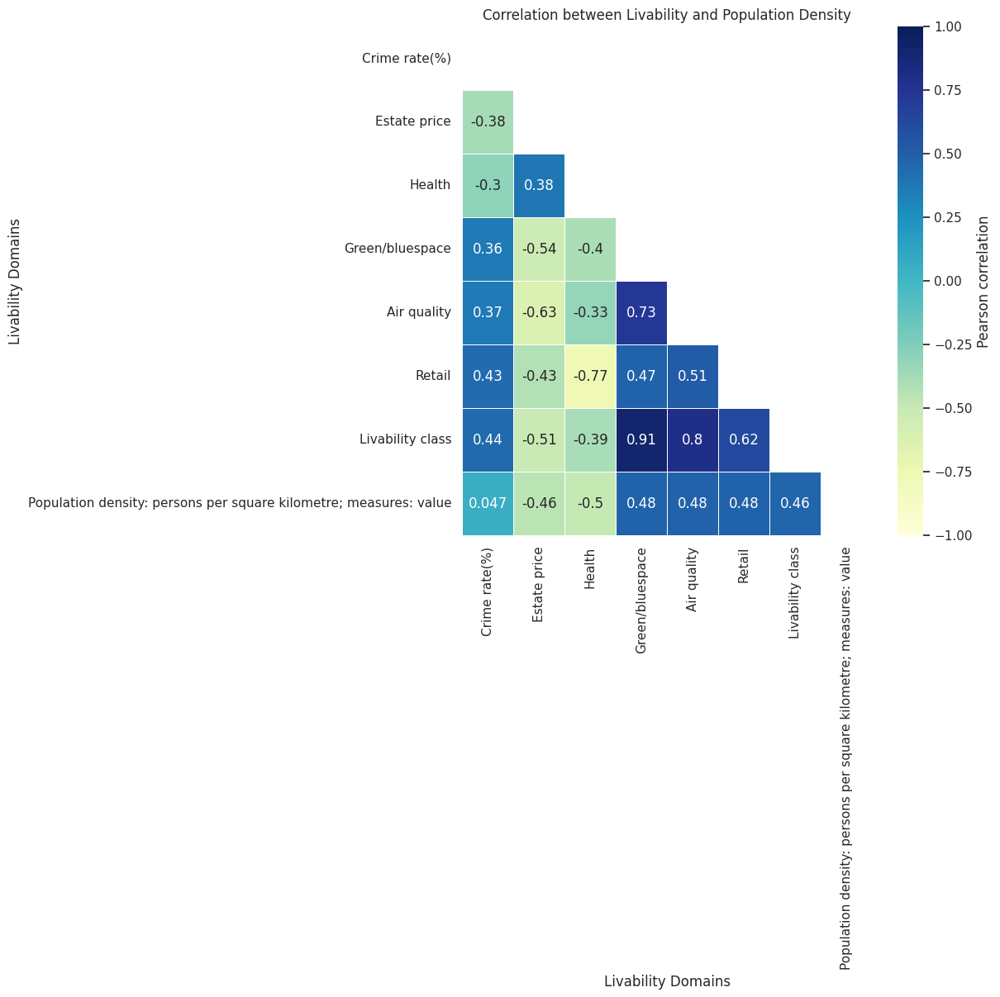

In [113]:
# visualisation
# define plot size
fig,ax = plt.subplots(figsize=(8,8))

# define mask to apply to upper right hand corner of the plot
data_to_mask = np.triu(np.ones_like(Livability_Density_corr))

# define axis tick labels
# get the index and the columns, replace the underscores with spaces and remove 'domain' from the name
x_axis_labels = Livability_Density_corr.columns.str.replace('_',' ').str.replace('domain ','')
y_axis_labels = Livability_Density_corr.index.str.replace('_',' ').str.replace('domain ','')

# Have a look at what the tick labels look like
print('Labels:',x_axis_labels ,y_axis_labels)

# If we want to capitalize each tick label
# for each element in the list of x_axis_labels, capitalize it
x_axis_labels = [element.capitalize() for element in x_axis_labels]
y_axis_labels = [element.capitalize() for element in y_axis_labels]

# look at the new labels
print('Labels with capital letters:',x_axis_labels ,y_axis_labels)


# plot a heatmap of the correlation dataframe
sns.heatmap(Livability_Density_corr,
            # annotate so spearman's rank correlation values are displayed on the squares
            annot=True,
            # define colourmap
            cmap='YlGnBu',
            # add lines between cells
            linewidths=.5,
            # define value of minimum colour on cbar
            vmin=-1,
            # define value of maximum colour on cbar
            vmax=1,
            # add the mask
            mask=data_to_mask,
            # use the custom tick labels
            xticklabels=x_axis_labels,
            yticklabels=y_axis_labels,
            # add a label to the cbar
            cbar_kws={'label': "Pearson correlation"},
            # plot on the axis we defined
            ax=ax)

# Set axis labels
ax.set(xlabel="Livability Domains",
       ylabel="Livability Domains",
      title ='Correlation between Livability and Population Density' );
plt.savefig('Correlation_between_Livability_and_Population_Density.png')

# 3.2 Spatial Visualisation

# Step 1 Data preparation

In [114]:
# Remove rows with NaN values in the population_density column
Bradford_Livability = Bradford_Livability.dropna(subset=['Population Density: Persons per square kilometre; measures: Value'])

# Extract the population density column
population_density_column = 'Population Density: Persons per square kilometre; measures: Value'

# Step 2 Identify the best number of classes

Quantiles are estimated using the Sturges' Formula. The Sturges' Formula calculates the number of bins (or categories) of a histogram based on the number of data points in the data set.

In [115]:
# Claculate the Sturges' Formula
# Define a function to estimate the number of bins (or classes) using Sturges' Formula
def sturges_formula(data):
    """
    Estimate the number of bins (or classes) using Sturges' Formula.

    Args:
    - data: A 1D array-like object containing the data points.

    Returns:
    - num_bins: Estimated number of bins/classes.
    """
  # Calculate the number of data points
    num_data_points = len(data)

  # Estimate the number of bins/classes
    num_bins = int(np.ceil(1 + np.log2(num_data_points)))

    return num_bins

# Calculate the estimated number of quantiles
estimated_num_quantiles = sturges_formula(population_density_column)
print("Estimated number of quantiles:", estimated_num_quantiles)

Estimated number of quantiles: 8


# Step 3 Classify

In [116]:
# Define the number of quantiles (number of classes)
num_classes = 8

# Classify population density into quantiles, the quantile is the class
# Now the quantile is from 0 to 7
Bradford_Livability['quantiles'] = pd.qcut(Bradford_Livability[population_density_column], num_classes, labels=False)
# plus 1 to adjust it to 1-8
Bradford_Livability['quantiles'] += 1

In [117]:
# Define a dictionary mapping quantile values to category names
quantile_to_category = {
    1: 'Very Low',
    2: 'Low',
    3: 'Moderately Low',
    4: 'Moderate',
    5: 'Moderately High',
    6: 'High',
    7: 'Very High',
    8: 'Extremely High'
}

# Create a new column 'Population Density Level' by mapping the quantile values to category names
Bradford_Livability['Population Density Level'] = Bradford_Livability['quantiles'].map(quantile_to_category)

In [118]:
Bradford_Livability

,LSOA11CD,LSOA11NM,BNG_E,BNG_N,LONG_,LAT,Shape_Leng,GlobalID,geometry,LSOA code,...,estate price,geography,Population Density: Persons per square kilometre; measures: Value,score_crimerate,score_estateprice,co_score,Livability class,Livability level,quantiles,Population Density Level
0,E01010568,Bradford 016A,416258,438952,-1.75437,53.8466,4856.573980,5a4a0169-928f-47f6-9751-2de3693d6363,"POLYGON ((416422.170 439366.289, 416417.848 43...",E01010568,...,224611.0,Bradford 016A,2819.4,0.811688,0.176667,2.941154,2,Low,3,Moderately Low
1,E01010569,Bradford 016B,414693,438453,-1.77818,53.8421,5335.781207,1dda5258-8e18-4fea-aeeb-8b3b5c775dab,"POLYGON ((415369.043 439212.461, 415368.435 43...",E01010569,...,168978.0,Bradford 016B,2744.2,0.146104,0.313333,2.342308,1,Very Low,3,Moderately Low
2,E01010570,Bradford 018A,413992,438990,-1.78881,53.8470,6383.359834,7c0dc8b0-3a0b-47ee-ab6f-61731d98f85f,"POLYGON ((414005.260 439378.989, 414146.534 43...",E01010570,...,422778.0,Bradford 018A,1814.4,0.876623,0.030000,3.221514,2,Low,2,Low
3,E01010571,Bradford 016C,415223,438398,-1.77013,53.8416,4468.822410,f7cf3127-b907-450b-aa96-60c15eb5d905,"POLYGON ((415768.621 438654.729, 415766.728 43...",E01010571,...,143759.0,Bradford 016C,3662.9,0.431818,0.440000,2.683583,1,Very Low,4,Moderate
4,E01010572,Bradford 016D,415428,438857,-1.76699,53.8457,3580.702391,f0434345-63f5-4b9a-b2ae-14429111b22c,"POLYGON ((415616.807 439194.596, 415622.818 43...",E01010572,...,195984.0,Bradford 016D,5602.6,0.938312,0.240000,2.984602,2,Low,6,High
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
305,E01033693,Bradford 039J,416266,434273,-1.75450,53.8045,9072.306804,98df2d4d-0a3e-42b4-b252-c731364a2088,"POLYGON ((416131.041 434818.646, 416132.081 43...",E01033693,...,129000.0,Bradford 064A,2731.4,0.016234,0.546667,7.312845,7,High,3,Moderately Low
306,E01033694,Bradford 020F,414206,437969,-1.78560,53.8378,3203.820514,defcfeaa-913f-4695-a906-3cc416be753d,"POLYGON ((414278.306 438153.000, 414293.813 43...",E01033694,...,162061.0,Bradford 020F,4383.8,0.779221,0.346667,4.241242,3,Below Average,5,Moderately High
307,E01033695,Bradford 049H,412451,430195,-1.81258,53.7680,4003.083026,90bcb7d0-1c58-47c5-97ec-0513797e773d,"POLYGON ((412614.522 430615.896, 412625.338 43...",E01033695,...,152382.0,Bradford 049H,4983.9,0.691558,0.403333,2.229304,1,Very Low,5,Moderately High
308,E01033696,Bradford 049I,411932,430937,-1.82043,53.7747,4370.165737,33f9579e-fd08-491d-b782-8923788b6168,"POLYGON ((411951.812 431152.689, 411964.781 43...",E01033696,...,140319.0,Bradford 049I,4207.2,0.668831,0.463333,2.467465,1,Very Low,5,Moderately High


# Step 4 Visualisation

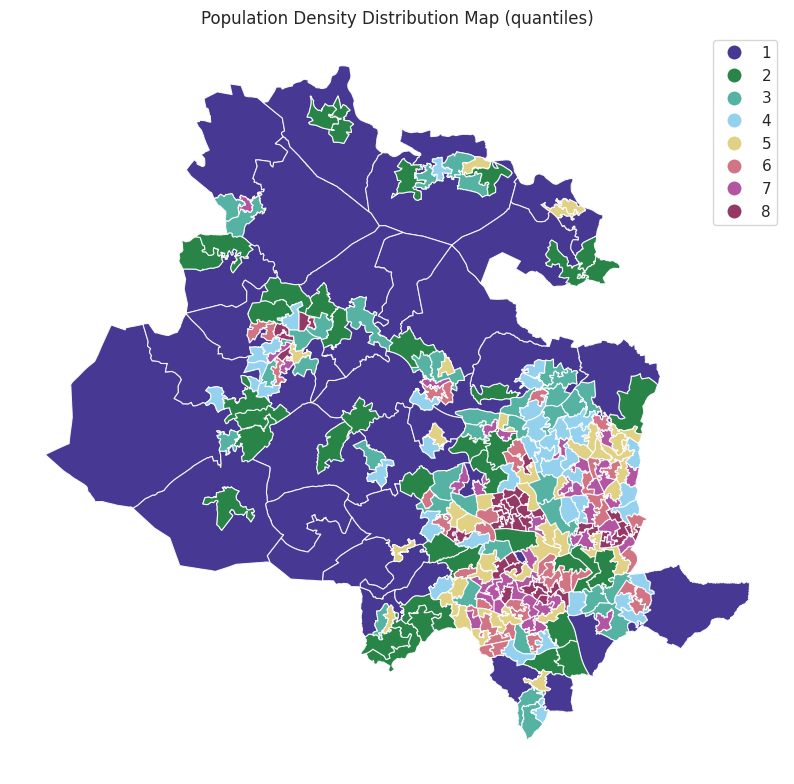

In [119]:
# Plot the distribution map
fig, ax = plt.subplots(1, 1, figsize=(10, 15))

# Define the hex colors corresponding to the population density categories
hex_colors = ['#332288','#117733','#44AA99','#88CCEE','#DDCC77','#CC6677','#AA4499','#882255']

# Create a colormap using the hex colors
from matplotlib.colors import ListedColormap
cmap = ListedColormap(hex_colors)

Bradford_Livability.plot(column='quantiles', categorical=True, cmap=cmap, linewidth=0.8, ax=ax, edgecolor='white', legend=True, alpha=0.9)
ax.set_title('Population Density Distribution Map (quantiles)')
ax.set_axis_off()
plt.show()

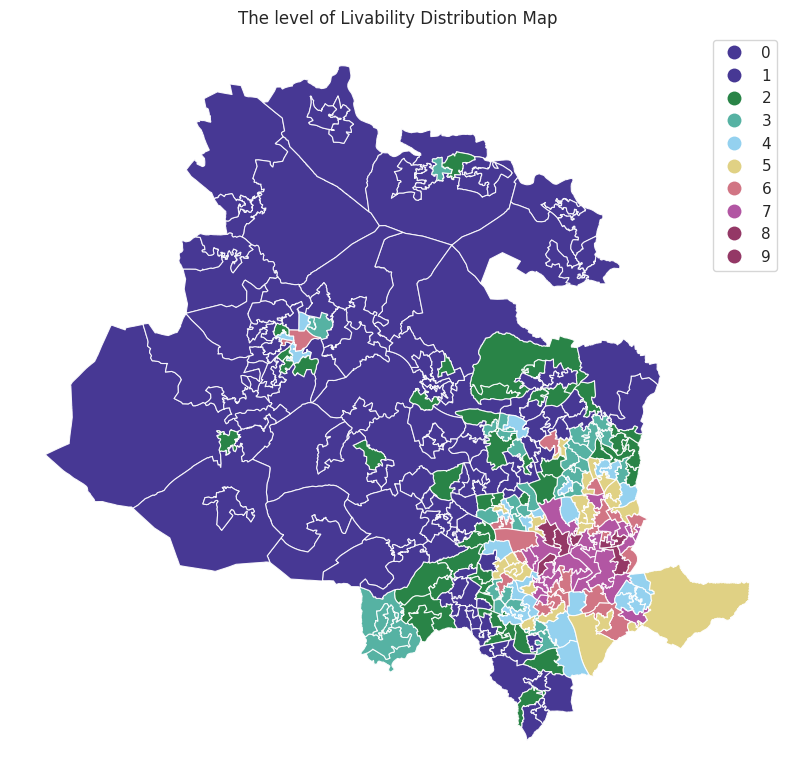

In [123]:
# Plot the distribution map
fig, ax = plt.subplots(1, 1, figsize=(10, 15))

# Define the hex colors corresponding to the population density categories
hex_colors = ['#332288','#117733','#44AA99','#88CCEE','#DDCC77','#CC6677','#AA4499','#882255']

# Create a colormap using the hex colors
from matplotlib.colors import ListedColormap
cmap = ListedColormap(hex_colors)

Bradford_Livability.plot(column='Livability class', categorical=True, cmap=cmap, linewidth=0.8, ax=ax, edgecolor='white', legend=True, alpha=0.9)
ax.set_title('The level of Livability Distribution Map')
ax.set_axis_off()
plt.show()

There are some LSOAs not shown on the map due to missing data.

In [124]:
map = Bradford_Livability.explore(cmap=hex_colors)

# save to html file
map.save("Bradford_Population_Density_map.html")

# view map
map
